# Detección de anomalías. Detección de tumores cerebrales.

Documento realizado por:


*   Daniel Lillo Plaza
*   Carlos Blom-Dahl Ramos



## Carga de datos

No recomendamos volver a ejecutar las celdas por la fase de carga. Si aún así lo considera oportuno entonces descargue del siguiente link el dataset:

https://www.kaggle.com/datasets/felipekitamura/head-ct-hemorrhage

y a continuación súbalo a su Drive y especifique su ruta más abajo.

El conjunto de datos utilizado es un conjunto de tomografías de cerebros, tanto con tumores como sin tumores.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dense, Flatten, Reshape
from keras.models import Model
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix


Primero vamos a importar los datos, para ello utilizamos el paquete _pillow_ ya que tenemos que convertir los png a una matriz de escala de grises. El primer conjunto llamado train solo contiene fotos de cerebros sin anomalias.

In [ ]:
# importamos los datos, estos son png's pero los convertimos a matrices en escala de grises

folder_path_1 = './drive/MyDrive/Deep_Learning/Autoencoders/Entregable_final/data/train/good' 
train = []

for filename in os.listdir(folder_path_1):
    if filename.endswith('.png'):
        image_path = os.path.join(folder_path_1, filename)
        with Image.open(image_path) as img:
            gray_scale_img = np.array(img.convert('L'))
            train.append(gray_scale_img)

train = np.array(train)
train = train.astype('float32') / 255

# Vamos a extraer un conjunto de validación de imagenes sin anomalias, en el conjunto de test hay muy pocas imagenes sin anomalias (10)

train, val_good = train_test_split(train, test_size=0.2, random_state=0)

Ahora construimos el test, este tiene tanto fotos con anomalias como sin anomalias.

In [ ]:
folder_path_2 = './drive/MyDrive/Deep_Learning/Autoencoders/Entregable_final/data/test/bad/' 
test_bad = []

for filename in os.listdir(folder_path_2):
    if filename.endswith('.png'):
        image_path = os.path.join(folder_path_2, filename)
        with Image.open(image_path) as img:
            gray_scale_img = np.array(img.convert('L'))
            test_bad.append(gray_scale_img)

test_bad = np.array(test_bad)
test_bad.shape
test_bad = test_bad.astype('float32') / 255
# Separamos las anomalias en 2, un conjunto para ver los resultados finales y otro para validar

val_bad, test_bad = train_test_split(test_bad, test_size=0.5, random_state=0)

In [ ]:
validation = np.concatenate((val_good, val_bad))
validation_class = np.concatenate((0*np.ones(len(val_good)),np.ones(len(val_bad))))
validation, validation_class = shuffle(validation,validation_class, random_state=0)

In [ ]:
folder_path_3 = './drive/MyDrive/Deep_Learning/Autoencoders/Entregable_final/data/test/good/' 
test_good = []

for filename in os.listdir(folder_path_3):
    if filename.endswith('.png'):
        image_path = os.path.join(folder_path_3, filename)
        with Image.open(image_path) as img:
            gray_scale_img = np.array(img.convert('L'))
            test_good.append(gray_scale_img)

test_good = np.array(test_good)
test_good = test_good.astype('float32') / 255

Ahora que ya hemos cargado las fotos vamos a visualizar algunas de las normales.

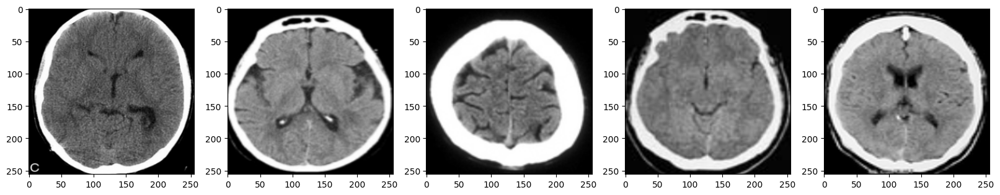

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))
for i in range(5):
    axs[i].imshow(train[i], cmap='gray')
plt.show()

Ahora algunas de las que tienen anomalias.

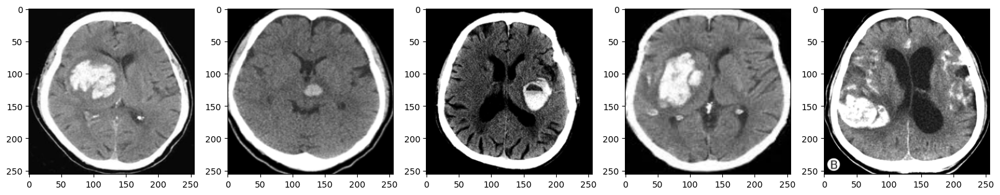

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))
for i in range(5):
    axs[i].imshow(val_bad[i], cmap='gray')
plt.show()

Trabajamos con un conjunto de datos con pocas muestras y demasiadas calificadas como anomalias pero creemos que podremos obtener algún resultado interesante. Hemos separado los datos en varios conjuntos, ahora los enumeramos y contextualizamos:


1.   _Train_: Este conjunto solo contiene cerebros sin tumores, el objetivo es entrenar los autoencoders solo con datos normales. 
2.   _val\_good_: En este encontramos los datos de validación sin tumores.
3.   _val\_bad_: En este encontramos los datos de validación con tumores.
4.   _test\_good_: En este encontramos los datos de test sin tumores.
5.   _test\_bad_: En este encontramos los datos de test con tumores.

## Autoencoder convolucional (completo)

Primero comenzamos con un autoencoder convolucional con la siguiente arquitectura. Después de mucho probar llegamos a la conclusión de que esta es una muy buena opción para este problema. 

In [ ]:
np.random.seed(0)

input_img = Input(shape=(256, 256,1))

# Definir el encoder
x = Conv2D(64, (10, 10), activation='relu', padding='same')(input_img)
x = MaxPooling2D((4, 4), padding='same')(x)
x = Conv2D(32, (5, 5), activation='relu', padding='same')(x)
x = MaxPooling2D((4, 4), padding='same')(x)
x = Conv2D(8, (5, 5), activation='relu', padding='same')(x)
encoded = MaxPooling2D((4,4), padding='same')(x)

# Definir el decoder
x = Conv2D(8, (5, 5), activation='relu', padding='same')(encoded)
x = UpSampling2D((4, 4))(x)
x = Conv2D(32, (5, 5), activation='relu', padding='same')(x)
x = UpSampling2D((4, 4))(x)
x = Conv2D(64, (10, 10), activation='relu', padding='same')(x)
x = UpSampling2D((4, 4))(x)
decoded = Conv2D(1, (4, 4), activation='sigmoid', padding='same')(x)

# Definir el modelo
autoencoder_conv = Model(input_img, decoded)

# Compilar el modelo
autoencoder_conv.compile(optimizer='adam', loss='binary_crossentropy') # binary_crossentropy
#autoencoder_conv.summary()
# Entrenar el modelo
history = autoencoder_conv.fit(train, train, epochs=100, batch_size=10, shuffle=True, validation_data=(validation, validation))

# Guardaremos el encoder para la parte final, asi ahorramos tiempo de computación al no tener que entrenar el encoder
encoder_conv = Model(input_img, encoded)

Epoch 1/100
8/8 [==============================] - 16s 236ms/step - loss: 0.6760 - val_loss: 0.6712
Epoch 2/100
8/8 [==============================] - 1s 68ms/step - loss: 0.6257 - val_loss: 0.6609
Epoch 3/100
8/8 [==============================] - 1s 67ms/step - loss: 0.5988 - val_loss: 0.6705
Epoch 4/100
8/8 [==============================] - 1s 67ms/step - loss: 0.5847 - val_loss: 0.6282
Epoch 5/100
8/8 [==============================] - 0s 63ms/step - loss: 0.5733 - val_loss: 0.6248
Epoch 6/100
8/8 [==============================] - 0s 62ms/step - loss: 0.5583 - val_loss: 0.6104
Epoch 7/100
8/8 [==============================] - 0s 62ms/step - loss: 0.5447 - val_loss: 0.5996
Epoch 8/100
8/8 [==============================] - 0s 62ms/step - loss: 0.5337 - val_loss: 0.5888
Epoch 9/100
8/8 [==============================] - 0s 63ms/step - loss: 0.5256 - val_loss: 0.5951
Epoch 10/100
8/8 [==============================] - 0s 62ms/step - loss: 0.5167 - val_loss: 0.5765
Epoch 11/100
8/8 

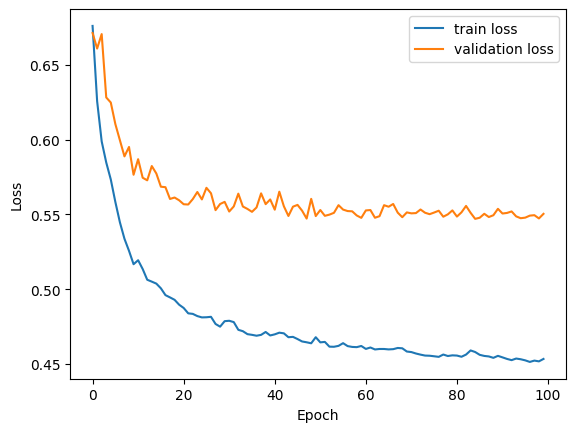

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Graficar ambas curvas de pérdida
plt.plot(train_loss, label='train loss')
plt.plot(val_loss, label='validation loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [ ]:
autoencoder_conv.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      6464      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        51232     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 8)         6408  

Observamos ahora diferentes CTs (computed tomographies). Estas CTs son solo de cerebros sanos. Junto a la imagen original mostramos la imagen reconstruida mediante el autoencoder anterior.

1/1 [==============================] - 1s 1s/step


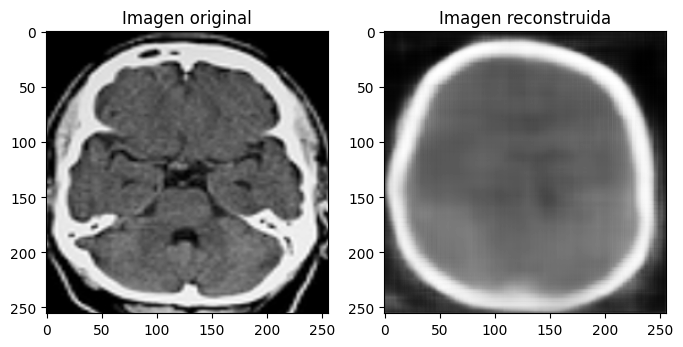

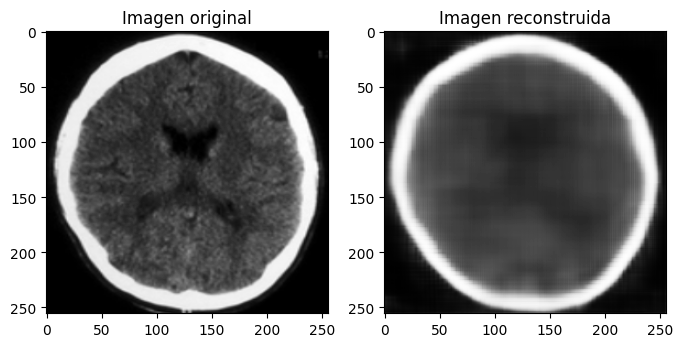

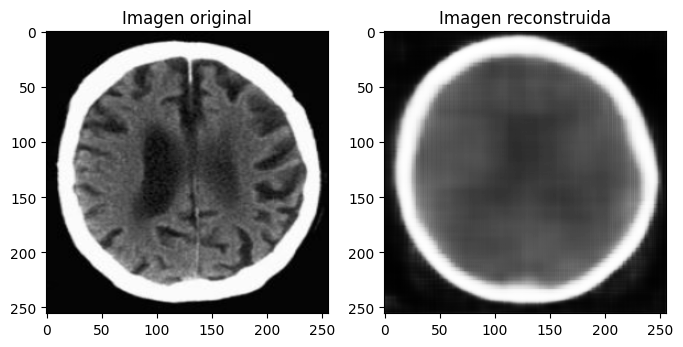

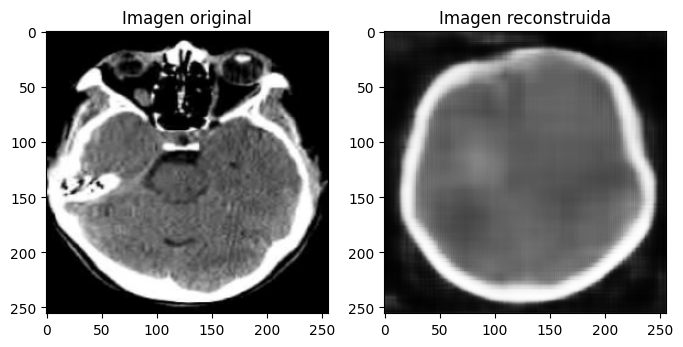

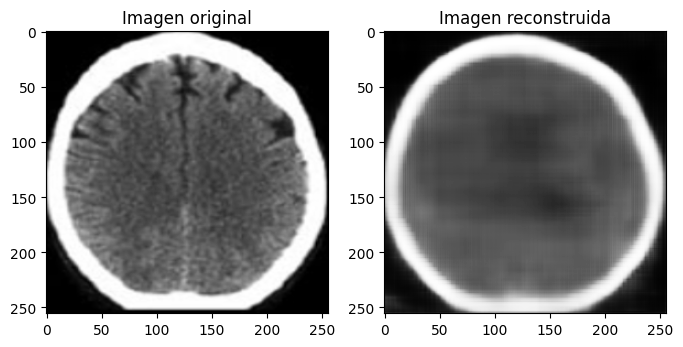

In [ ]:
img_dec_val_good = autoencoder_conv.predict(val_good)
picks = [1 , 2 , 3, 4, 5]

for i in picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(val_good[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_dec_val_good[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

Ahora vamos a proceder de forma análoga con las CTs de cerebros con tumores, estas serán nuestras anomalias.

2/2 [==============================] - 2s 13ms/step


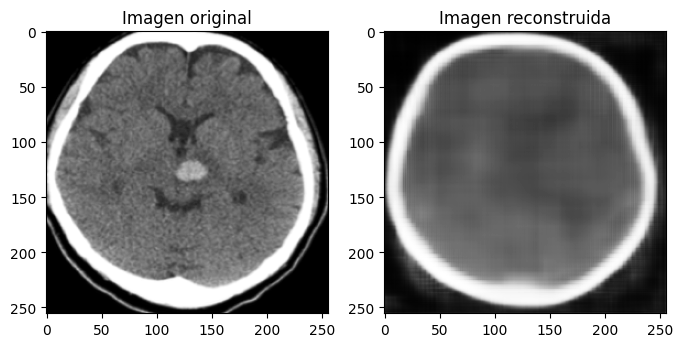

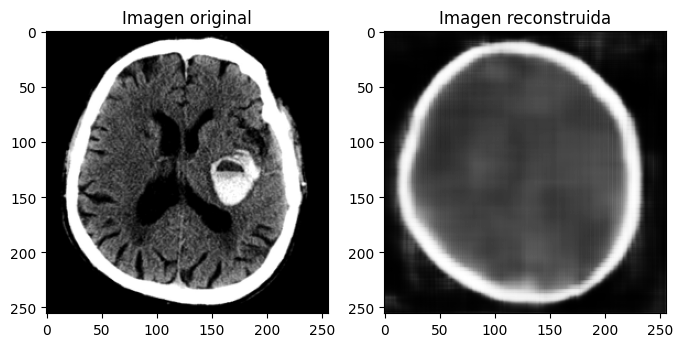

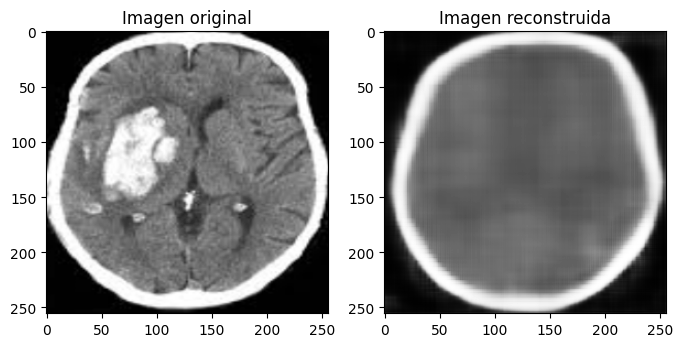

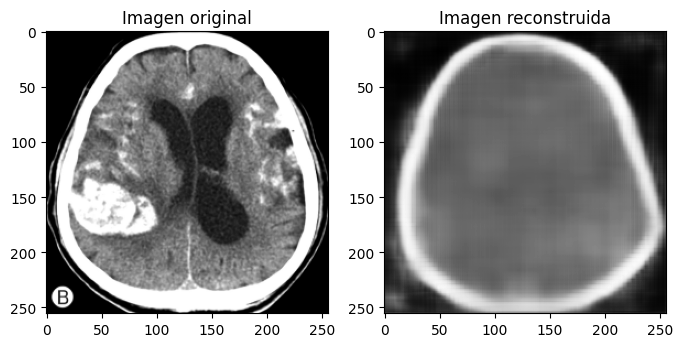

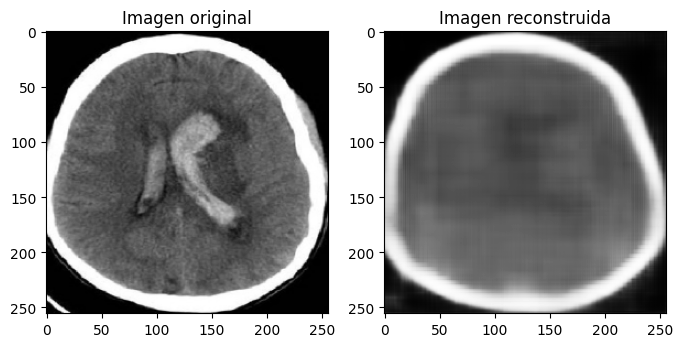

In [ ]:
img_dec_val_bad = autoencoder_conv.predict(val_bad)
picks = [1 , 2 , 3, 4, 5]

for i in picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(val_bad[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_dec_val_bad[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

Ahora vamos a calcular los errores cometidos al reconstruir tanto en las CTs normales como anómalas. Hecho esto fijaremos un umbral mediante el cual clasificaremos. 

1/1 [==============================] - 0s 22ms/step


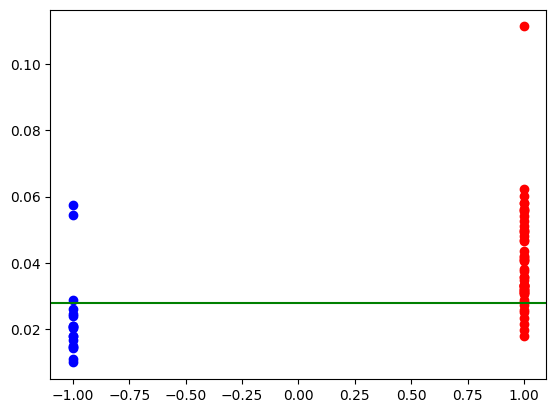

In [ ]:
val_bad_reshaped = val_bad.reshape(val_bad.shape[0], val_bad.shape[1], val_bad.shape[2], 1)
val_bad_pred = autoencoder_conv.predict(val_bad_reshaped)
error_val_bad = np.mean(np.abs(val_bad_reshaped - val_bad_pred) ** 2, axis=tuple(range(1, val_bad_reshaped.ndim)))

val_good_reshaped = val_good.reshape(val_good.shape[0], val_good.shape[1], val_good.shape[2], 1)
val_good_pred = autoencoder_conv.predict(val_good_reshaped)
error_val_good = np.mean(np.abs(val_good_reshaped - val_good_pred) ** 2, axis=tuple(range(1, val_bad_reshaped.ndim)))

plt.figure()
plt.scatter(1+0*np.arange(len(error_val_bad)),error_val_bad,c='r')
plt.scatter(-1+0*np.arange(len(error_val_good)),error_val_good,c='b')
plt.axhline(y=0.028, color='g')


En este caso parece tener sentido trazar el umbral representado por la línea verde, donde los puntos azules por encima de dicha recta son los casos normales clasificados erroneamente como anómalos y los puntos rojos por debajo de la línea verde serían los casos anómalos clasificados como normales.

Aunque intuitivamente se puede fijar vamos a sustentar nuestra decisión con la curva ROC.

In [ ]:
validation_pred = autoencoder_conv.predict(validation).squeeze(axis=-1)
error_validation = np.mean(np.abs(validation - validation_pred) ** 2, axis=tuple(range(1, validation_pred.ndim)))

3/3 [==============================] - 0s 219ms/step


In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

# Obtener la curva ROC y la AUC
fpr, tpr, thresholds = roc_curve(validation_class, error_validation)
auc = roc_auc_score(validation_class, error_validation)

# Encontrar el umbral óptimo que maximiza la precisión de la clasificación
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_compl = thresholds[optimal_idx]

# Aplicar el umbral óptimo a las probabilidades de clase para obtener la clasificación binaria final
y_pred = (error_validation >= optimal_threshold_compl).astype(int)

print(optimal_threshold_compl)

0.027383342


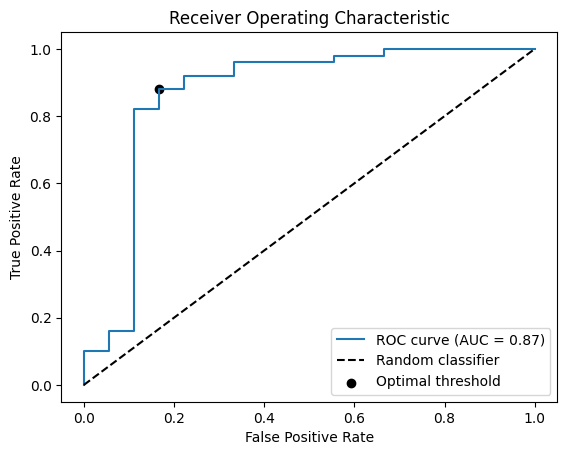

In [ ]:
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)

# Trazar una línea diagonal para clasificador aleatorio
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')

# Trazar el umbral óptimo
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='black', label='Optimal threshold')

# Ajustar el gráfico
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

Observando esta curva ROC hemos optado por tomar el valor óptimo que encontramos.

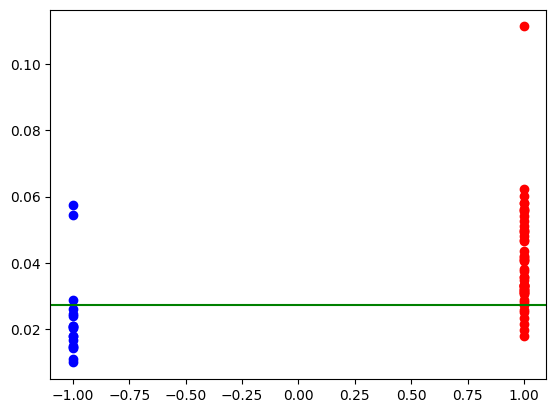

In [ ]:
plt.figure()
plt.scatter(1+0*np.arange(len(error_val_bad)),error_val_bad,c='r')
plt.scatter(-1+0*np.arange(len(error_val_good)),error_val_good,c='b')
plt.axhline(y=optimal_threshold_compl, color='g')

Representando este umbral "óptimo" vemos que no estábamos muy alejados de un resultado aceptable.

In [ ]:

conf_matrix = confusion_matrix(validation_class, y_pred)

print(conf_matrix)

[[15  3]
 [ 6 44]]


Con esta matriz de confusión observamos que hay errores de ambos tipos en el conjunto de validación. Se podría argumentar que tiene sentido priorizar dejar a 0 el número de CTs anómalas clasificadas como normales, pero al hacerlo queda demasiado solapamiento entre ambos grupos y siempre se hará la predicción de anómala.

Veamos su desempeño en el conjunto de test.

In [ ]:
img_test_bad = autoencoder_conv.predict(test_bad).squeeze(axis=-1)
img_test_good = autoencoder_conv.predict(test_good).squeeze(axis=-1)

error_test_bad = np.mean(np.abs(test_bad - img_test_bad) ** 2, axis=tuple(range(1, img_test_bad.ndim)))
error_test_good = np.mean(np.abs(test_good - img_test_good) ** 2, axis=tuple(range(1, img_test_good.ndim)))

pred_test_bad_compl = (error_test_bad >= optimal_threshold_compl).astype(int)
print(pred_test_bad_compl)
pred_test_good_compl = (error_test_good >= optimal_threshold_compl).astype(int)
print(pred_test_good_compl)

1/1 [==============================] - 0s 23ms/step
[0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1
 0 1 0 1 0 1 1 1 0 0 1 0 1]
[0 1 0 0 0 0 0 0 0 0]


Observemos las tomografías anómalas clasificadas como normales:

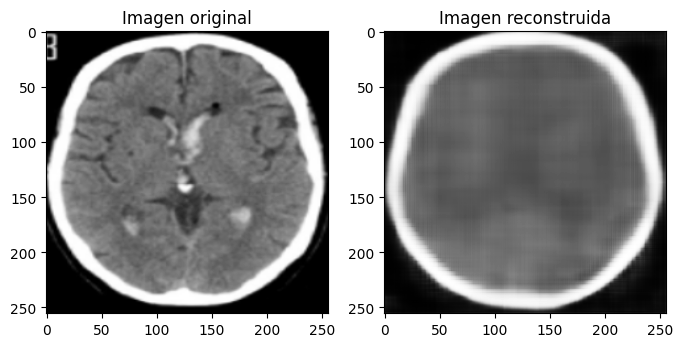

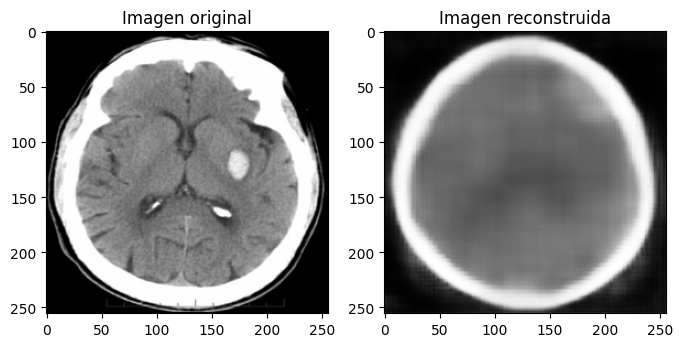

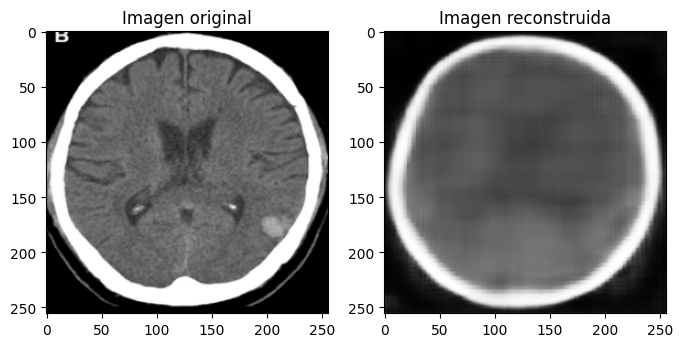

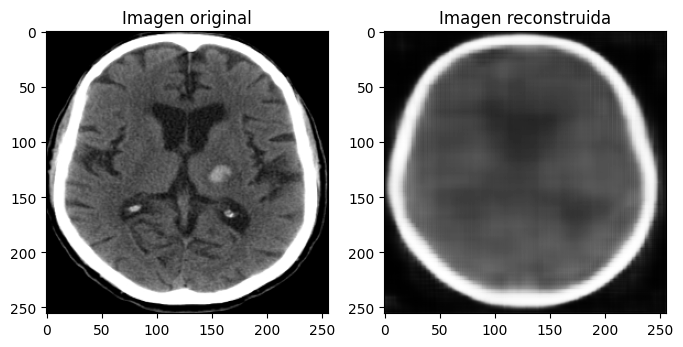

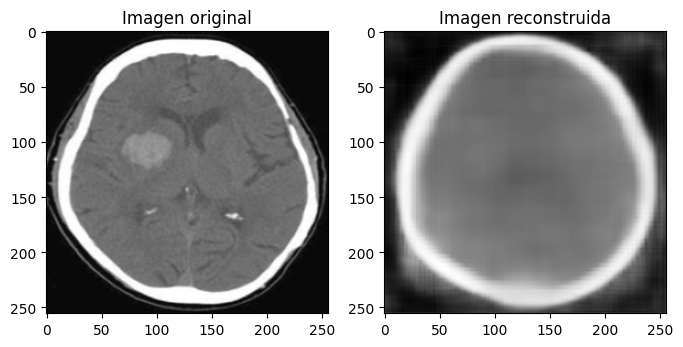

...

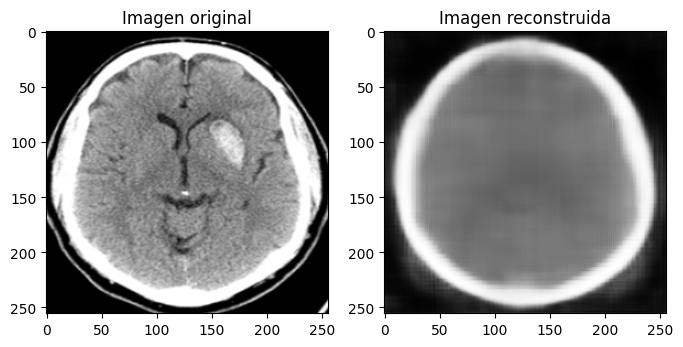

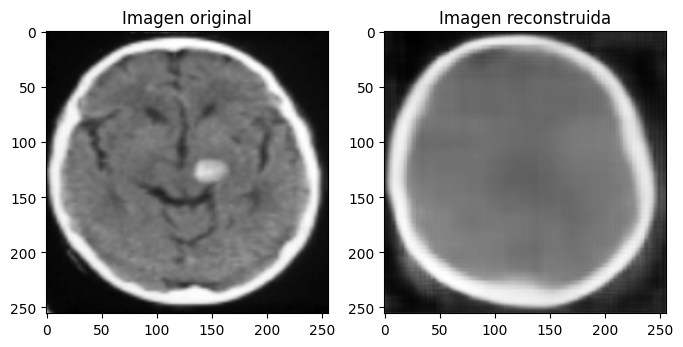

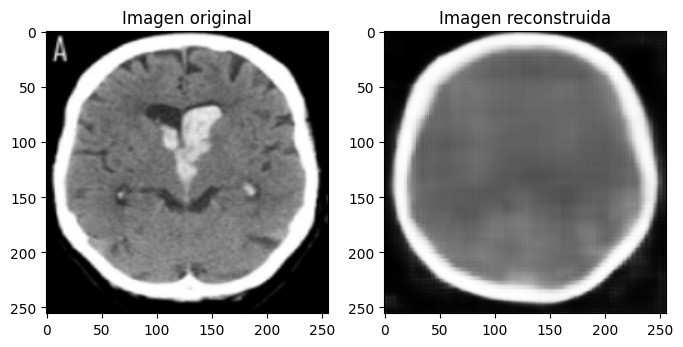

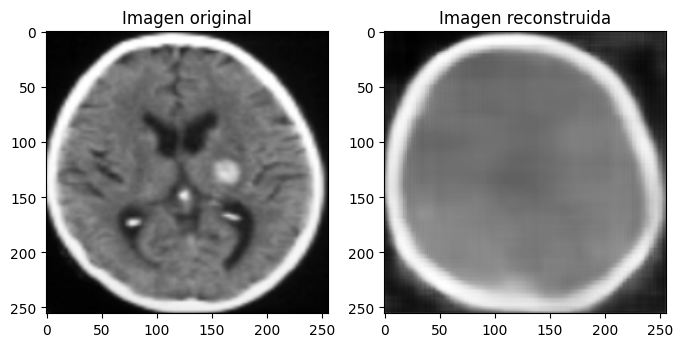

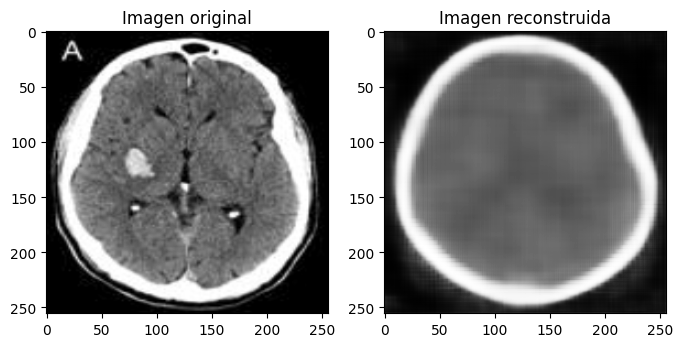

In [ ]:
failed_bad_picks = np.where(pred_test_bad_compl == 0)[0]

for i in failed_bad_picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(test_bad[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_test_bad[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

Observamos que se caracterizan por tener manchas de tamaño no muy grande de un color claro aunque no blanco.

Veamos ahora las CTs normales clasificadas como anómalas.

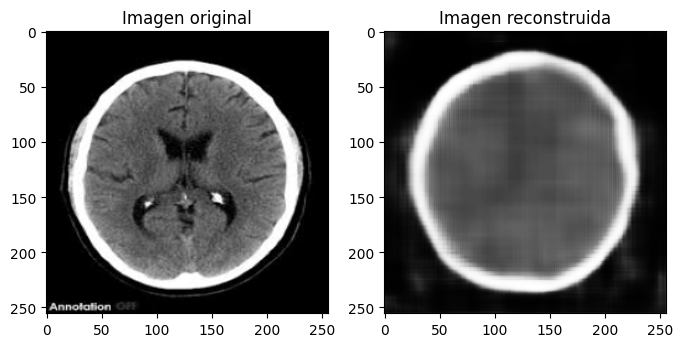

In [ ]:
failed_good_picks = np.where(pred_test_good_compl == 1)[0]

for i in failed_good_picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(test_good[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_test_good[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

Observamos que la CT tiene dos manchas de color muy claro, más claro que las tumores observados, parece aceptable clasificarla como anómala. 

## PCA + Decoder 

Ahora vamos a proceder de forma análoga pero ahora la primera parte del autoencoder (encoder) será una PCA. Una vez se transforman los datos mediante la PCA, utilizamos esos datos para entrenar un decoder, cuyo objetivo será obtener las imágenes originales.

Veamos la curva de la varianza explicada acumulada según el número de componentes principales.

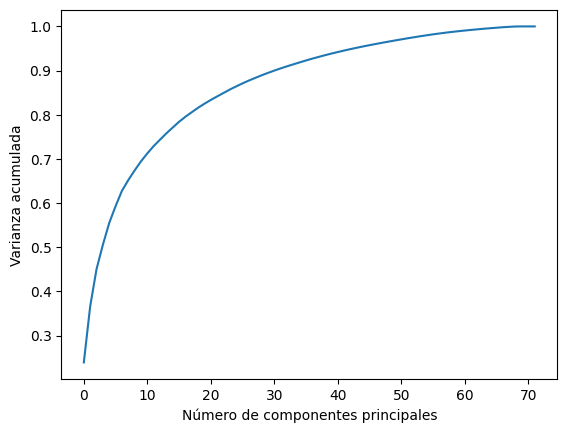

In [ ]:
pca = PCA(n_components=72)

# Ajusta los datos al objeto PCA
train_vect = train.reshape(train.shape[0],train.shape[1]*train.shape[2])
pca.fit(train_vect)

var_exp = pca.explained_variance_ratio_

# Calcula la varianza acumulada para cada número de componentes principales
cum_var_exp = np.cumsum(var_exp)

plt.plot(cum_var_exp)
plt.xlabel('Número de componentes principales')
plt.ylabel('Varianza acumulada')
plt.show()

In [ ]:
n_comp = 10

pca = PCA(n_components=n_comp)

# Ajusta los datos al objeto PCA
train_vect = train.reshape(train.shape[0],train.shape[1]*train.shape[2])
pca.fit(train_vect)


# Transforma los datos en las nuevas coordenadas de los componentes principales
train_pca = pca.transform(train_vect)
print(train_pca.shape) #nos quedamos con 10 variables

(72, 10)


El número de variables es un parámetro fijado junto a la arquitectura del decoder convolucional, estos parámetros son los que mejor resultado nos han dado después de numerosas pruebas.

In [ ]:
np.random.seed(0)

# Define el decoder
decoder_input = Input(shape=(n_comp,))
x = Dense(16*16, activation='sigmoid')(decoder_input)
x = Reshape((16, 16, 1))(x)
x = Conv2D(32, (2, 2), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (4,4), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (6, 6), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (8,8), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoder_output = Conv2D(1, (1,1), activation='sigmoid', padding='same')(x)
decoder_pca = Model(decoder_input, decoder_output)


# Compila el autoencoder
decoder_pca.compile(optimizer='adam', loss='mse')


# Entrena el autoencoder
validation_vect = validation.reshape(validation.shape[0],validation.shape[1]*validation.shape[2])
validation_pca = pca.transform(validation_vect)

history = decoder_pca.fit(train_pca, train, epochs=50, batch_size=10,validation_data = (validation_pca,validation))

Epoch 1/50
8/8 [==============================] - 9s 404ms/step - loss: 0.1012 - val_loss: 0.0905
Epoch 2/50
8/8 [==============================] - 1s 143ms/step - loss: 0.0887 - val_loss: 0.0846
Epoch 3/50
8/8 [==============================] - 1s 127ms/step - loss: 0.0843 - val_loss: 0.0844
Epoch 4/50
8/8 [==============================] - 1s 127ms/step - loss: 0.0813 - val_loss: 0.0812
Epoch 5/50
8/8 [==============================] - 1s 146ms/step - loss: 0.0790 - val_loss: 0.0811
Epoch 6/50
8/8 [==============================] - 1s 130ms/step - loss: 0.0779 - val_loss: 0.0807
Epoch 7/50
8/8 [==============================] - 1s 145ms/step - loss: 0.0742 - val_loss: 0.0790
Epoch 8/50
8/8 [==============================] - 1s 130ms/step - loss: 0.0721 - val_loss: 0.0774
Epoch 9/50
8/8 [==============================] - 1s 145ms/step - loss: 0.0693 - val_loss: 0.0767
Epoch 10/50
8/8 [==============================] - 1s 127ms/step - loss: 0.0665 - val_loss: 0.0733
Epoch 11/50
8/8 [==

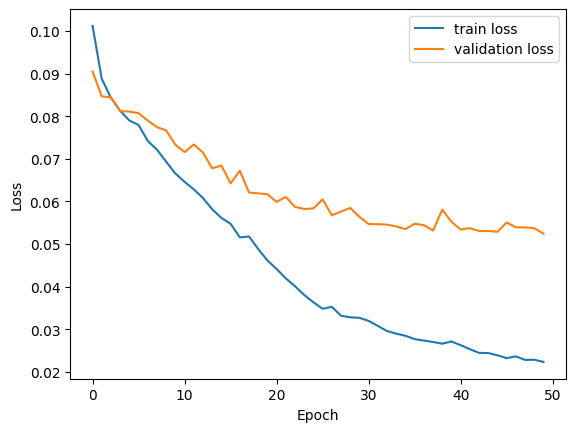

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 10)]              0         
                                                                 
 dense (Dense)               (None, 256)               2816      
                                                                 
 reshape (Reshape)           (None, 16, 16, 1)         0         
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 16, 32)        160       
                                                                 
 up_sampling2d_3 (UpSampling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        16416     
                                                           

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Graficar ambas curvas de pérdida
plt.plot(train_loss, label='train loss')
plt.plot(val_loss, label='validation loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

decoder_pca.summary()

Volvemos a observar CTs originales junto a sus reconstrucciones de cerebros normales primero y anómalos después.

1/1 [==============================] - 1s 1s/step


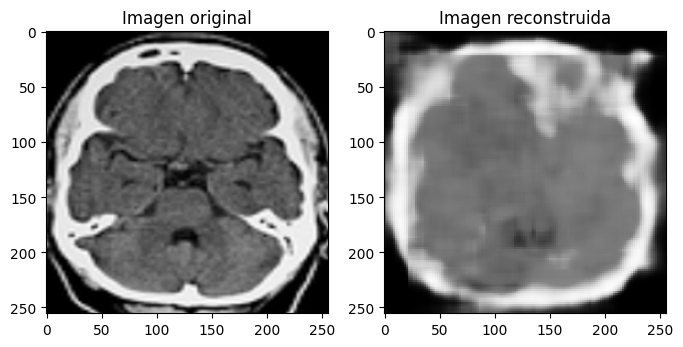

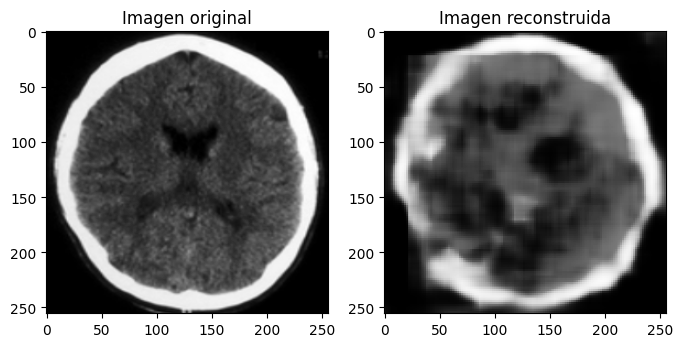

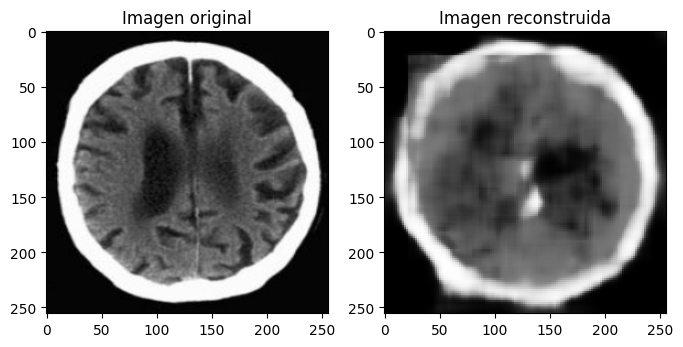

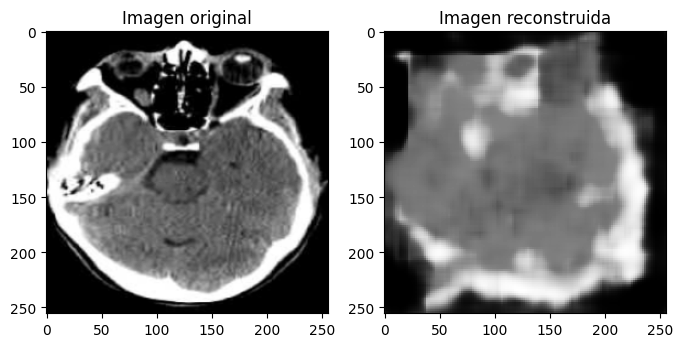

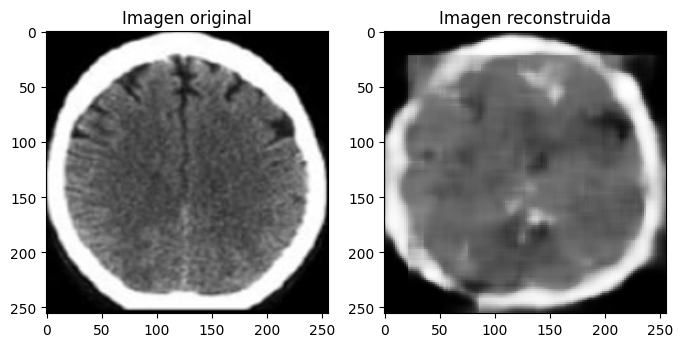

In [ ]:
val_good_vect = val_good.reshape(val_good.shape[0],val_good.shape[1]*val_good.shape[2])
val_good_pca = pca.transform(val_good_vect)

img_pca_val_good = decoder_pca.predict(val_good_pca)
picks = [1 , 2 , 3, 4, 5]

for i in picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(val_good[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_pca_val_good[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

2/2 [==============================] - 3s 14ms/step


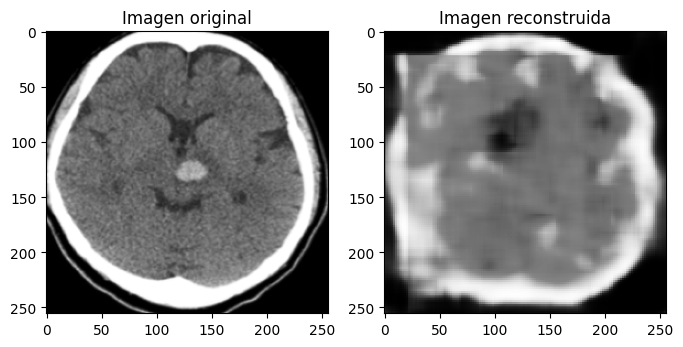

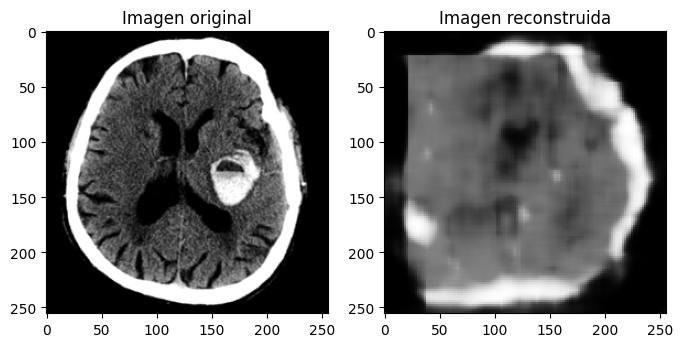

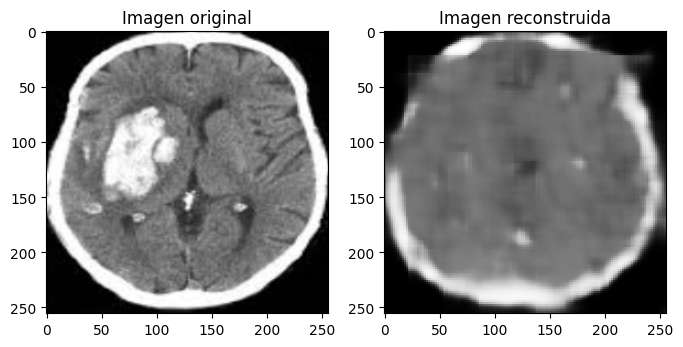

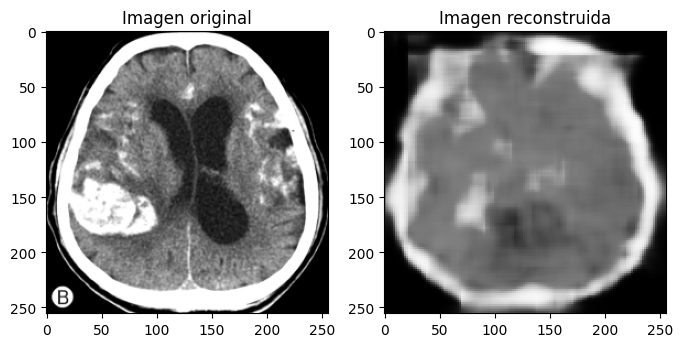

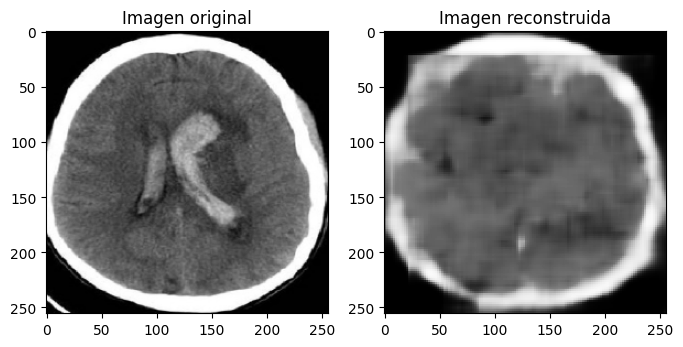

In [ ]:
val_bad_vect = val_bad.reshape(val_bad.shape[0],val_bad.shape[1]*val_bad.shape[2])
val_bad_pca = pca.transform(val_bad_vect)
img_pca_val_bad = decoder_pca.predict(val_bad_pca)
picks = [1 , 2 , 3, 4, 5]

for i in picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(val_bad[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_pca_val_bad[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

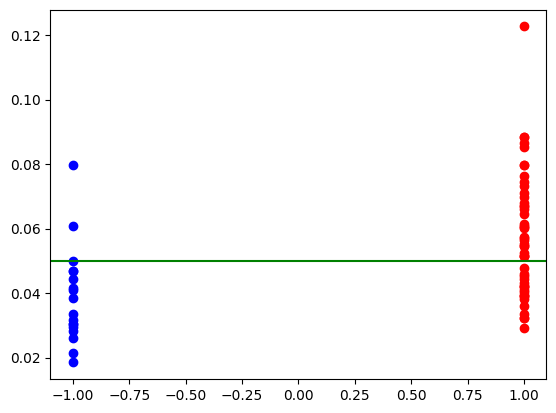

In [ ]:
error_val_bad_pca = np.mean(np.abs(img_pca_val_bad.squeeze(-1) - val_bad) ** 2, axis=tuple(range(1, val_bad.ndim)))

error_val_good_pca = np.mean(np.abs(img_pca_val_good.squeeze(-1) - val_good) ** 2, axis=tuple(range(1, val_bad.ndim)))

plt.figure()
plt.scatter(1+0*np.arange(len(error_val_bad_pca)),error_val_bad_pca,c='r')
plt.scatter(-1+0*np.arange(len(error_val_good_pca)),error_val_good_pca,c='b')
plt.axhline(y=0.05, color='g')


Otra vez volvemos a hacer una primera aproximación del valor del umbral "a ojo". Para después seleccionar el óptimo de la curva ROC.

In [ ]:
validation_pred_pca = decoder_pca.predict(validation_pca).squeeze(axis=-1)
error_validation_pca = np.mean(np.abs(validation - validation_pred_pca) ** 2, axis=tuple(range(1, validation_pred_pca.ndim)))

3/3 [==============================] - 1s 324ms/step


In [ ]:
# Obtener la curva ROC y la AUC
fpr, tpr, thresholds = roc_curve(validation_class, error_validation_pca)
auc = roc_auc_score(validation_class, error_validation_pca)

# Encontrar el umbral óptimo que maximiza la precisión de la clasificación
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_pca = thresholds[optimal_idx]

# Aplicar el umbral óptimo a las probabilidades de clase para obtener la clasificación binaria final
y_pred_pca = (error_validation_pca >= optimal_threshold_pca).astype(int)

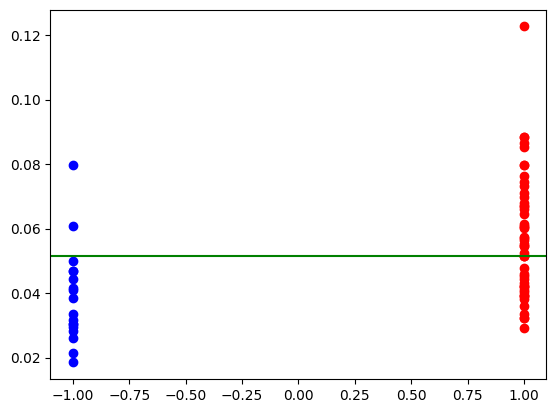

In [ ]:
plt.figure()
plt.scatter(1+0*np.arange(len(error_val_bad_pca)),error_val_bad_pca,c='r')
plt.scatter(-1+0*np.arange(len(error_val_good_pca)),error_val_good_pca,c='b')
plt.axhline(y=optimal_threshold_pca, color='g')

Observamos un umbral muy similar.

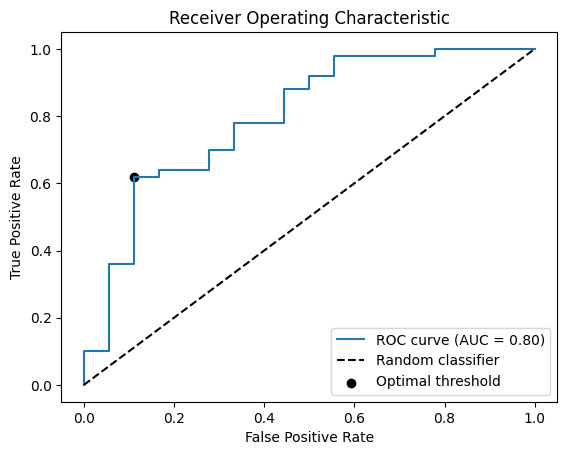

In [ ]:
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)

# Trazar una línea diagonal para clasificador aleatorio
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')

# Trazar el umbral óptimo
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='black', label='Optimal threshold')

# Ajustar el gráfico
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [ ]:
conf_matrix = confusion_matrix(validation_class, y_pred_pca)

print(conf_matrix)

[[16  2]
 [19 31]]


Ahora observamos que en el conjunto de validación obtenemos un error muy bajo en los falsos positivos.

In [ ]:
test_bad_vect = test_bad.reshape(test_bad.shape[0],test_bad.shape[1]*test_bad.shape[2])
test_bad_pca = pca.transform(test_bad_vect)
img_test_bad_pca = decoder_pca.predict(test_bad_pca).squeeze(axis=-1)

test_good_vect = test_good.reshape(test_good.shape[0],test_good.shape[1]*test_good.shape[2])
test_good_pca = pca.transform(test_good_vect)
img_test_good_pca = decoder_pca.predict(test_good_pca).squeeze(axis=-1)

error_test_bad_pca = np.mean(np.abs(test_bad - img_test_bad_pca) ** 2, axis=tuple(range(1, img_test_bad_pca.ndim)))
error_test_good_pca = np.mean(np.abs(test_good - img_test_good_pca) ** 2, axis=tuple(range(1, img_test_good_pca.ndim)))

pred_test_bad_pca = (error_test_bad_pca >= optimal_threshold_pca).astype(int)
print(pred_test_bad_pca)
pred_test_good_pca = (error_test_good_pca >= optimal_threshold_pca).astype(int)
print(pred_test_good_pca)

1/1 [==============================] - 0s 26ms/step
[0 0 1 0 0 1 1 0 0 0 1 1 1 1 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 1
 0 1 0 1 0 1 1 1 0 0 0 0 1]
[0 0 0 0 0 0 0 0 0 0]


Vemos que este clasificador no termina de detectar los tumores, aunque si que es verdad que en el test, cuando una CT la clasifica como anómala, en efecto es anómala

## Encoder + Decoder (entrenamiento independiente)

Finalmente vamos a realizar una labor muy similar a la anterior, pero en lugar de utilizar una primera parte de encoder caracterizada por una PCA ahora vamos a utilizar un encoder convolucional. Este encoder es el de la primera parte.

In [ ]:
np.random.seed(0)

input_latent = Input(shape=(4, 4, 8)) # definir la forma de la entrada del decoder
x = Conv2D(8, (5, 5), activation='relu', padding='same')(input_latent)
x = UpSampling2D((4, 4))(x)
x = Conv2D(32, (5, 5), activation='relu', padding='same')(x)
x = UpSampling2D((4, 4))(x)
x = Conv2D(64, (10, 10), activation='relu', padding='same')(x)
x = UpSampling2D((4, 4))(x)
decoded = Conv2D(1, (4, 4), activation='sigmoid', padding='same')(x)

decoder_conv = Model(input_latent, decoded)

# Configurar el decoder para usar las representaciones latentes generadas por el encoder anterior como entrada
latent_representation = encoder_conv.predict(train) # obtener las representaciones latentes del conjunto de datos
decoder_input = latent_representation.reshape((len(latent_representation), 4, 4, 8))
latent_representation_validation = encoder_conv.predict(validation)
# Compilar el modelo del decoder
decoder_conv.compile(optimizer='adam', loss='binary_crossentropy')

# Entrenar el modelo del decoder
history_decoder = decoder_conv.fit(decoder_input, train, epochs=100, batch_size=10, shuffle=True, validation_data=(latent_representation_validation.reshape((len(latent_representation_validation), 4, 4, 8)), validation))

3/3 [==============================] - 0s 9ms/step
Epoch 1/100
8/8 [==============================] - 2s 83ms/step - loss: 0.8347 - val_loss: 0.6925
Epoch 2/100
8/8 [==============================] - 0s 55ms/step - loss: 0.6914 - val_loss: 0.6897
Epoch 3/100
8/8 [==============================] - 0s 55ms/step - loss: 0.6791 - val_loss: 0.6803
Epoch 4/100
8/8 [==============================] - 0s 56ms/step - loss: 0.6520 - val_loss: 0.6760
Epoch 5/100
8/8 [==============================] - 0s 55ms/step - loss: 0.6305 - val_loss: 0.6491
Epoch 6/100
8/8 [==============================] - 0s 56ms/step - loss: 0.6077 - val_loss: 0.6330
Epoch 7/100
8/8 [==============================] - 0s 55ms/step - loss: 0.5893 - val_loss: 0.6210
Epoch 8/100
8/8 [==============================] - 0s 56ms/step - loss: 0.5702 - val_loss: 0.6065
Epoch 9/100
8/8 [==============================] - 0s 46ms/step - loss: 0.5535 - val_loss: 0.5953
Epoch 10/100
8/8 [==============================] - 0s 47ms/step - 

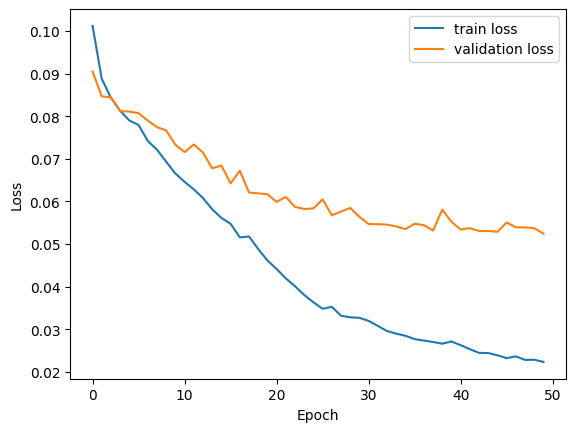

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 10)]              0         
                                                                 
 dense (Dense)               (None, 256)               2816      
                                                                 
 reshape (Reshape)           (None, 16, 16, 1)         0         
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 16, 32)        160       
                                                                 
 up_sampling2d_3 (UpSampling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        16416     
                                                           

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Graficar ambas curvas de pérdida
plt.plot(train_loss, label='train loss')
plt.plot(val_loss, label='validation loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

decoder_pca.summary()

1/1 [==============================] - 0s 75ms/step


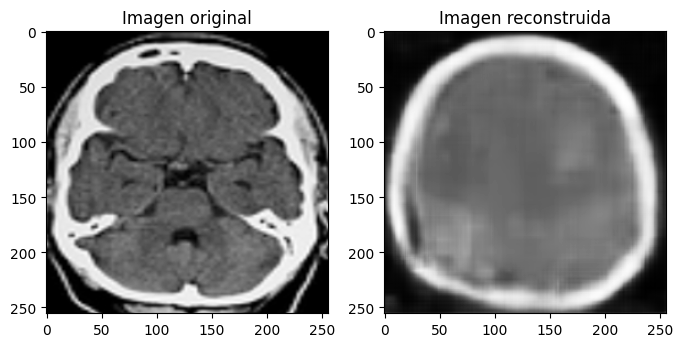

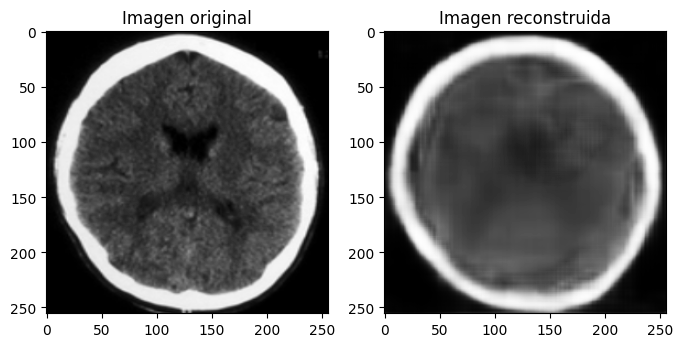

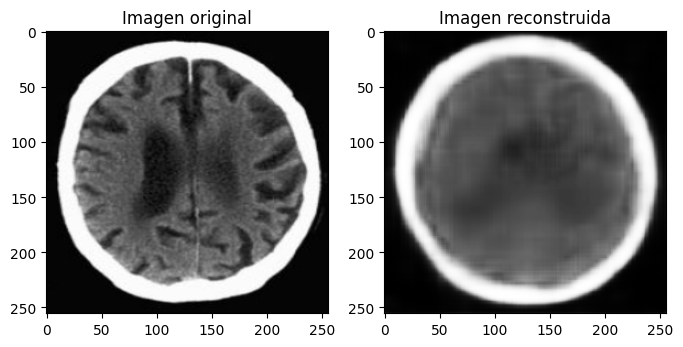

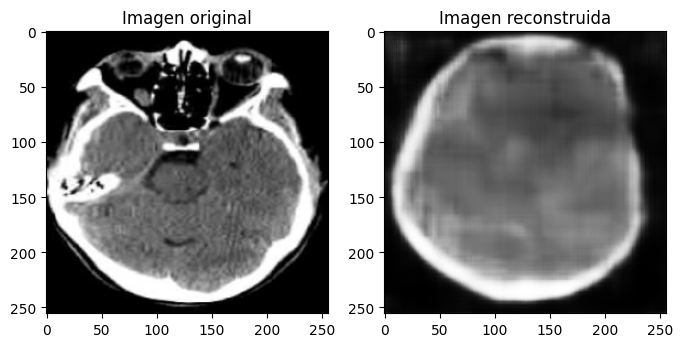

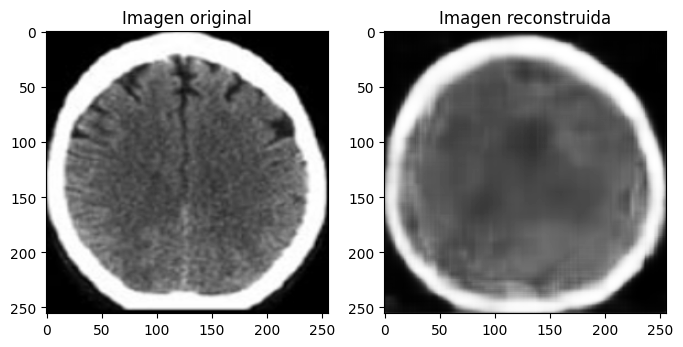

In [ ]:
val_good_lat = encoder_conv.predict(val_good)

img_lat_val_good = decoder_conv.predict(val_good_lat)
picks = [1 , 2 , 3, 4, 5]

for i in picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(val_good[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_lat_val_good[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

2/2 [==============================] - 0s 40ms/step


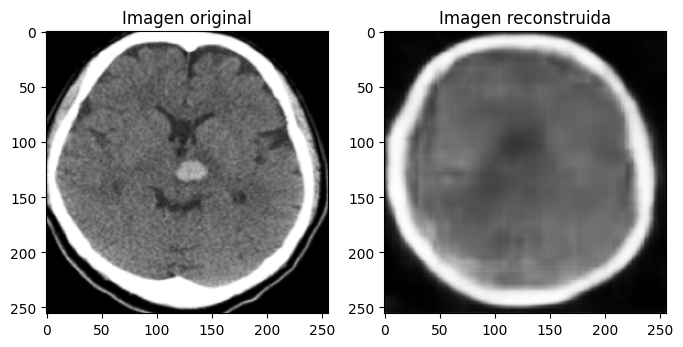

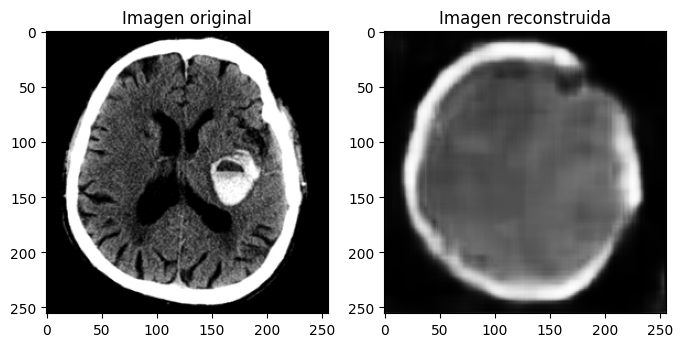

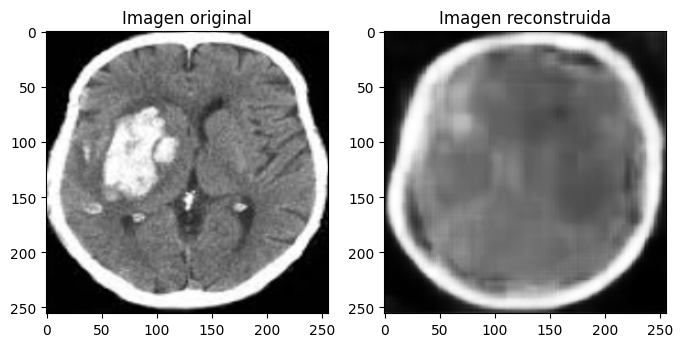

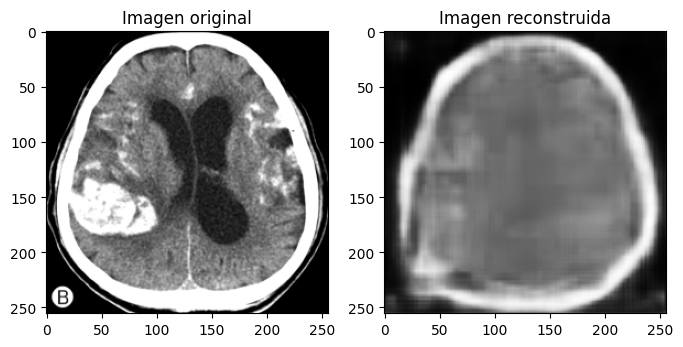

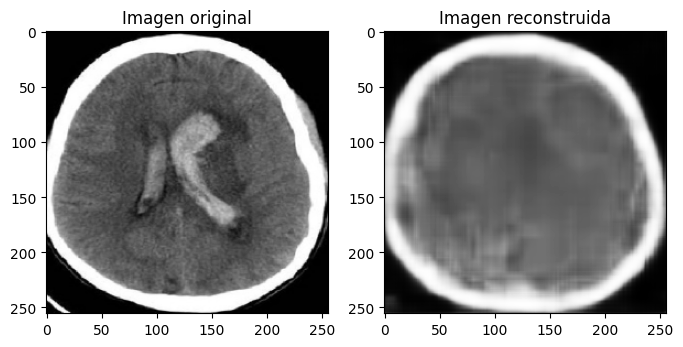

In [ ]:
val_bad_lat = encoder_conv.predict(val_bad)

img_lat_val_bad = decoder_conv.predict(val_bad_lat)
picks = [1 , 2 , 3, 4, 5]

for i in picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(val_bad[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_lat_val_bad[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

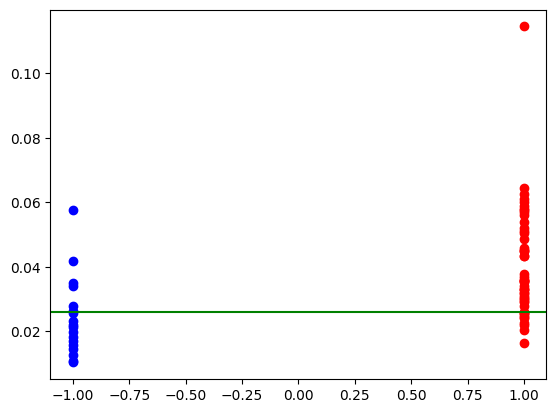

In [ ]:
error_val_bad_lat = np.mean(np.abs(img_lat_val_bad.squeeze(-1) - val_bad) ** 2, axis=tuple(range(1, val_bad.ndim)))

error_val_good_lat = np.mean(np.abs(img_lat_val_good.squeeze(-1) - val_good) ** 2, axis=tuple(range(1, val_bad.ndim)))

plt.figure()
plt.scatter(1+0*np.arange(len(error_val_bad_lat)),error_val_bad_lat,c='r')
plt.scatter(-1+0*np.arange(len(error_val_good_lat)),error_val_good_lat,c='b')
plt.axhline(y=0.026, color='g')

In [ ]:
validation_pred_lat = decoder_conv.predict(latent_representation_validation).squeeze(axis=-1)
error_validation_lat = np.mean(np.abs(validation - validation_pred_lat) ** 2, axis=tuple(range(1, validation_pred_lat.ndim)))

3/3 [==============================] - 0s 41ms/step


In [ ]:
# Obtener la curva ROC y la AUC
fpr, tpr, thresholds = roc_curve(validation_class, error_validation_lat)
auc = roc_auc_score(validation_class, error_validation_lat)

# Encontrar el umbral óptimo que maximiza la precisión de la clasificación
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_lat = thresholds[optimal_idx]

# Aplicar el umbral óptimo a las probabilidades de clase para obtener la clasificación binaria final
y_pred_lat = (error_validation_lat >= optimal_threshold_lat).astype(int)
print(y_pred_lat)
print(optimal_threshold_lat)

[1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 0 0 0 0 1 0 1 1 1 0 0 1 0 1 1 1 1 1
 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 1 0 1 1 0 0 1 0 1 0 0 1 1 1]
0.029090758


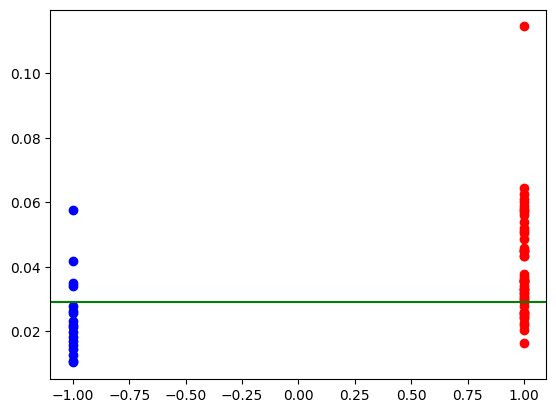

In [ ]:
plt.figure()
plt.scatter(1+0*np.arange(len(error_val_bad_lat)),error_val_bad_lat,c='r')
plt.scatter(-1+0*np.arange(len(error_val_good_lat)),error_val_good_lat,c='b')
plt.axhline(y=optimal_threshold_lat, color='g')

En este caso si nos hemos desviado más del "óptimo". Volvemos a destacar que no estamos dando excesiva importancia a clasificar las anomalias para no hacer un clasificador ZeroRules. Aunque si que le damos más importancia ya que el conjunto de test y validación están desbalanceados en favor de los datos anómalos.

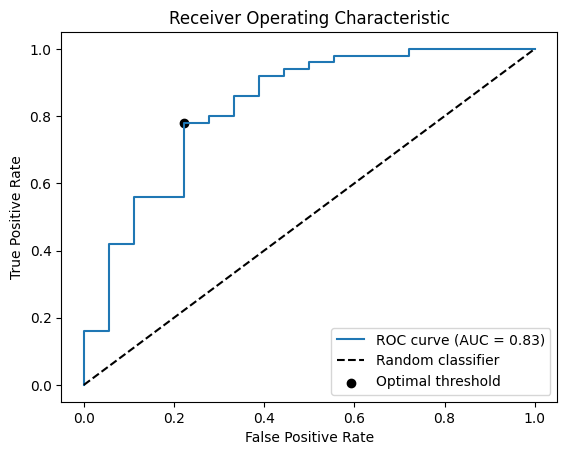

In [ ]:
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)

# Trazar una línea diagonal para clasificador aleatorio
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')

# Trazar el umbral óptimo
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='black', label='Optimal threshold')

# Ajustar el gráfico
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [ ]:
conf_matrix = confusion_matrix(validation_class, y_pred_pca)

print(conf_matrix)

[[16  2]
 [19 31]]


In [ ]:

test_bad_lat = encoder_conv.predict(test_bad)
img_test_bad_lat = decoder_conv.predict(test_bad_lat).squeeze(axis=-1)

test_good_lat = encoder_conv.predict(test_good)
img_test_good_lat = decoder_conv.predict(test_good_lat).squeeze(axis=-1)

error_test_bad_lat = np.mean(np.abs(test_bad - img_test_bad_lat) ** 2, axis=tuple(range(1, img_test_bad_lat.ndim)))
error_test_good_lat = np.mean(np.abs(test_good - img_test_good_lat) ** 2, axis=tuple(range(1, img_test_good_lat.ndim)))

pred_test_bad_lat = (error_test_bad_lat >= optimal_threshold_lat).astype(int)
print(pred_test_bad_lat)
pred_test_good_lat = (error_test_good_lat >= optimal_threshold_lat).astype(int)
print(pred_test_good_lat)

1/1 [==============================] - 0s 28ms/step
[0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1
 0 1 0 1 0 1 1 1 0 0 1 0 1]
[1 1 1 0 0 0 0 0 0 0]


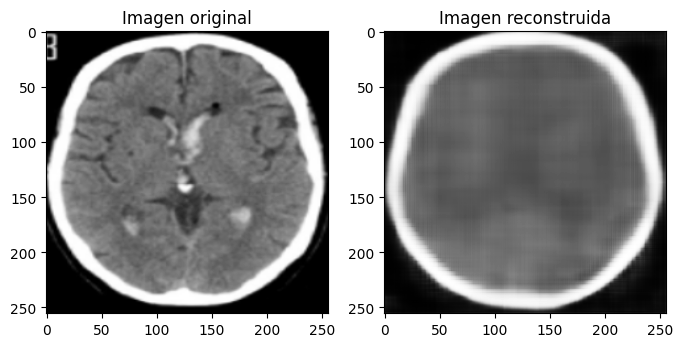

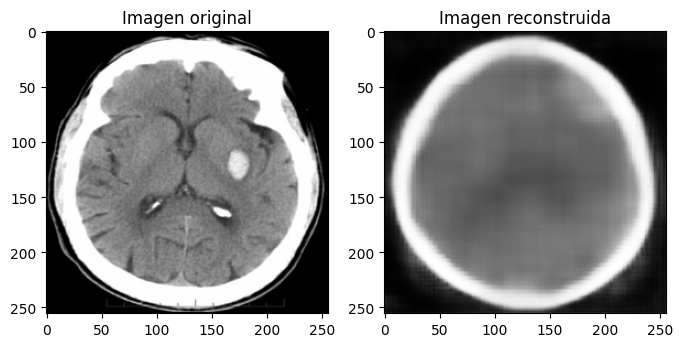

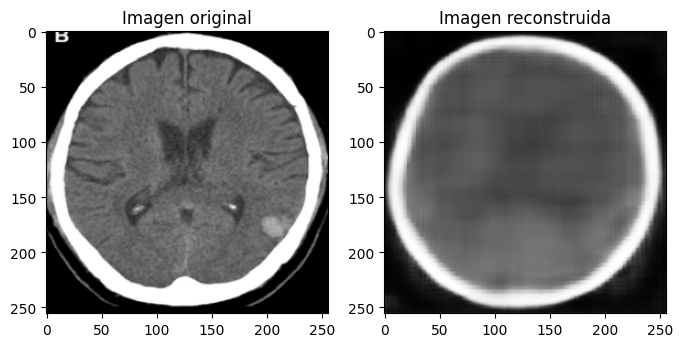

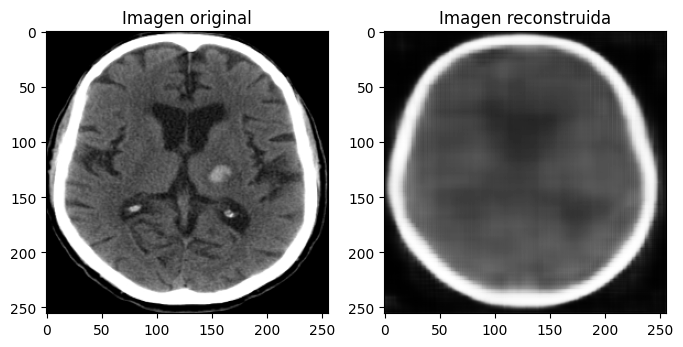

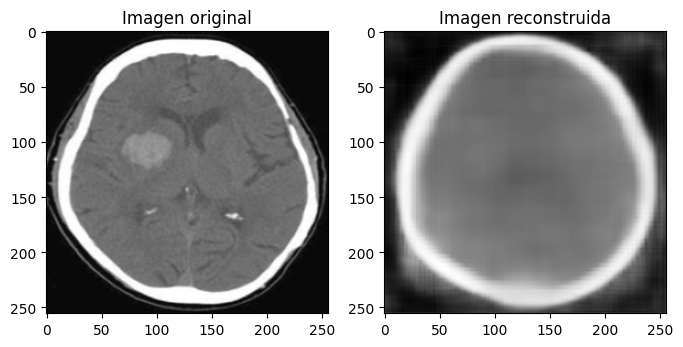

...

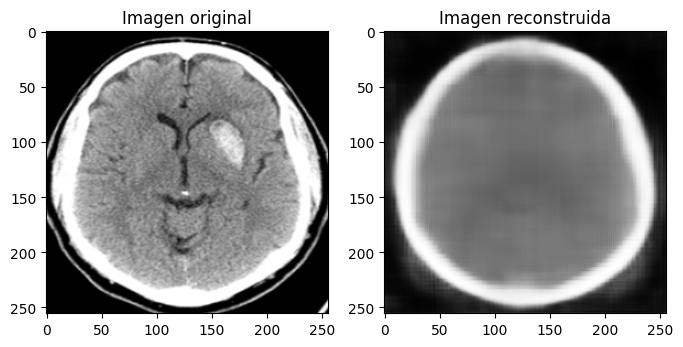

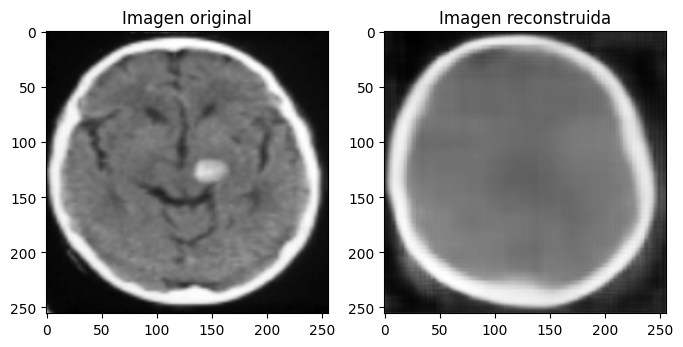

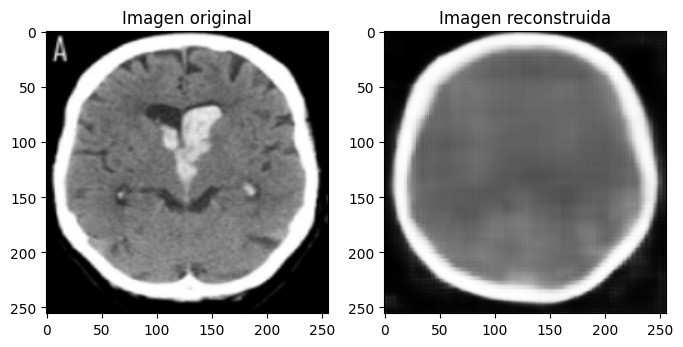

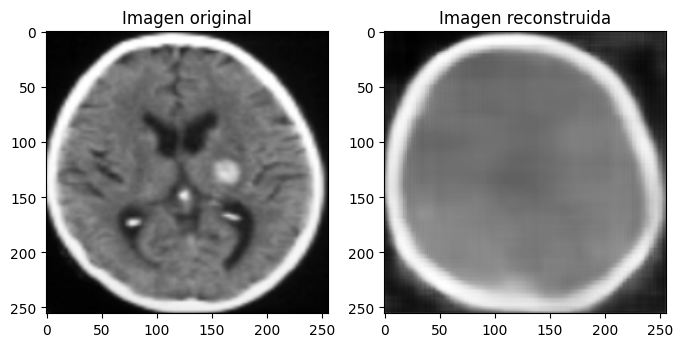

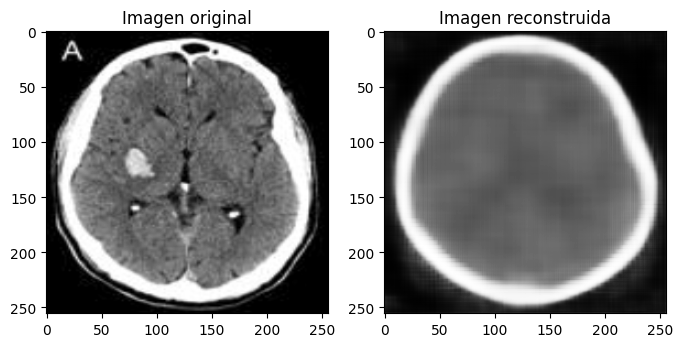

In [ ]:
failed_bad_picks = np.where(pred_test_bad_lat == 0)[0]

for i in failed_bad_picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(test_bad[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_test_bad[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

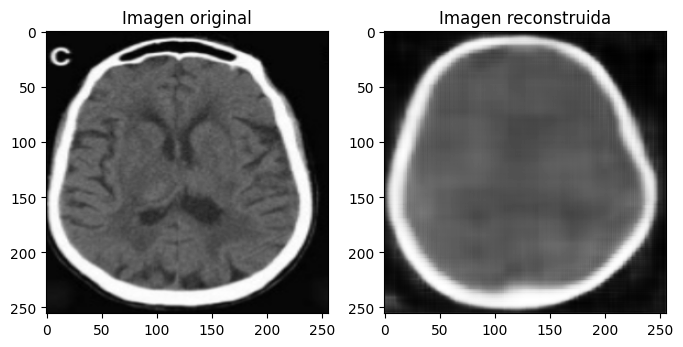

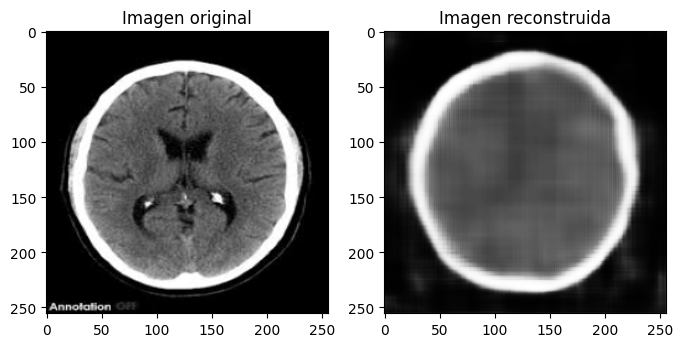

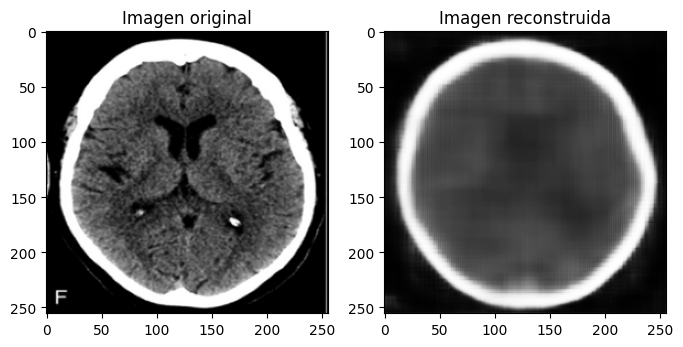

In [ ]:
failed_good_picks = np.where(pred_test_good_lat == 1)[0]

for i in failed_good_picks:
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))
  ax[0].imshow(test_good[i], cmap='gray')
  ax[0].set_title('Imagen original')
  ax[1].imshow(img_test_good[i], cmap='gray')
  ax[1].set_title('Imagen reconstruida')
  plt.show()

## Conclusiones

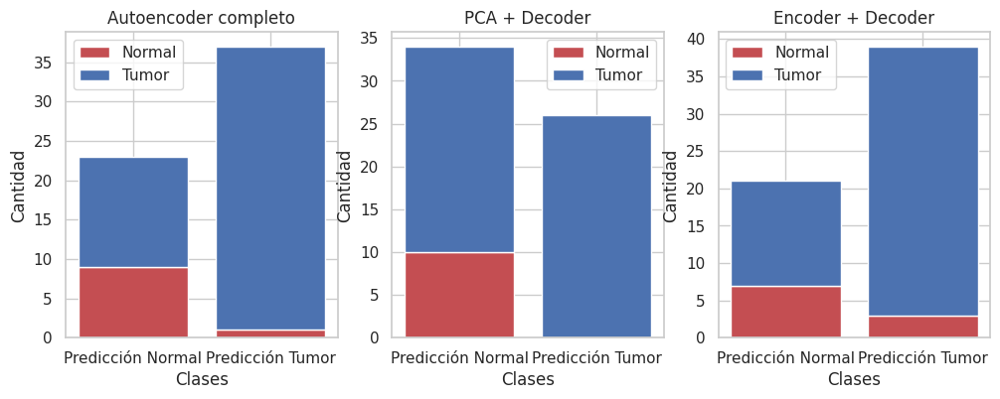

In [ ]:
from pyparsing.helpers import Sequence

import seaborn as sns

sns.set(style='whitegrid')

fig, axs = plt.subplots(1, 3, figsize=(12,4))

real_classes = np.concatenate((np.zeros_like(pred_test_good_compl),np.ones_like(pred_test_bad_compl)))
clase_pred = np.concatenate((pred_test_good_compl,pred_test_bad_compl))
# Separar los valores de las clases reales y las predicciones
real_0 = real_classes == 0
real_1 = real_classes == 1
pred_0 = clase_pred == 0
pred_1 = clase_pred == 1

# Contar la cantidad de veces que aparece cada combinación de valores
conteos_00 = np.sum(real_0 & pred_0)
conteos_01 = np.sum(real_0 & pred_1)
conteos_10 = np.sum(real_1 & pred_0)
conteos_11 = np.sum(real_1 & pred_1)

# Crear los datos para el gráfico de barras
valores = [0, 1]
conteos = [ [conteos_00, conteos_01], [conteos_10, conteos_11] ]

# Crear el gráfico de barras
axs[0].bar(valores, conteos[0], color='r')
axs[0].bar(valores, conteos[1], bottom=conteos[0], color='b')
axs[0].set_xticks([0, 1])
axs[0].set_xticklabels(['Predicción Normal', 'Predicción Tumor'])
axs[0].set_xlabel('Clases')
axs[0].set_ylabel('Cantidad')
axs[0].set_title('Autoencoder completo')
axs[0].legend(['Normal', 'Tumor'])




real_classes = np.concatenate((np.zeros_like(pred_test_good_pca),np.ones_like(pred_test_bad_pca)))
clase_pred = np.concatenate((pred_test_good_pca,pred_test_bad_pca))
# Separar los valores de las clases reales y las predicciones
real_0 = real_classes == 0
real_1 = real_classes == 1
pred_0 = clase_pred == 0
pred_1 = clase_pred == 1

# Contar la cantidad de veces que aparece cada combinación de valores
conteos_00 = np.sum(real_0 & pred_0)
conteos_01 = np.sum(real_0 & pred_1)
conteos_10 = np.sum(real_1 & pred_0)
conteos_11 = np.sum(real_1 & pred_1)

# Crear los datos para el gráfico de barras
valores = [0, 1]
conteos = [ [conteos_00, conteos_01], [conteos_10, conteos_11] ]

# Crear el gráfico de barras
axs[1].bar(valores, conteos[0], color='r')
axs[1].bar(valores, conteos[1], bottom=conteos[0], color='b')
axs[1].set_xticks([0, 1])
axs[1].set_xticklabels(['Predicción Normal', 'Predicción Tumor'])
axs[1].set_xlabel('Clases')
axs[1].set_title('PCA + Decoder')
axs[1].set_ylabel('Cantidad')
axs[1].legend(['Normal', 'Tumor'])





real_classes = np.concatenate((np.zeros_like(pred_test_good_lat),np.ones_like(pred_test_bad_lat)))
clase_pred = np.concatenate((pred_test_good_lat,pred_test_bad_lat))
# Separar los valores de las clases reales y las predicciones
real_0 = real_classes == 0
real_1 = real_classes == 1
pred_0 = clase_pred == 0
pred_1 = clase_pred == 1

# Contar la cantidad de veces que aparece cada combinación de valores
conteos_00 = np.sum(real_0 & pred_0)
conteos_01 = np.sum(real_0 & pred_1)
conteos_10 = np.sum(real_1 & pred_0)
conteos_11 = np.sum(real_1 & pred_1)

# Crear los datos para el gráfico de barras
valores = [0, 1]
conteos = [ [conteos_00, conteos_01], [conteos_10, conteos_11] ]

# Crear el gráfico de barras
axs[2].bar(valores, conteos[0], color='r')
axs[2].bar(valores, conteos[1], bottom=conteos[0], color='b')
axs[2].set_xticks([0, 1])
axs[2].set_xticklabels(['Predicción Normal', 'Predicción Tumor'])
axs[2].set_xlabel('Clases')
axs[2].set_ylabel('Cantidad')
axs[2].set_title('Encoder + Decoder')
axs[2].legend(['Normal', 'Tumor'])

Finalmente estos son los gráficos del conjunto de test de cada uno de los detectores de anomalías. Parece que los mejores resultados obtenidos son para el primer modelo. Hemos obtenido que prácticamente todas las CTs clasificadas como anómalas eran, en efecto, anómalas. Aunque esto es algo positivo también es cierto que aún hay bastante imágenes anómalas clasificadas como normales, lo cual se podría argumentar que es más negativo.

El resto de clasificadores obtienen resultados estrictamente peores, ya que clasifican más CTs normales como anómalas. Además el valor más importante, el número de CTs anómalas clasificadas como normales es igual o más alto en estos detectores de anomalías.